# Natural Language Processing (NLP) - Classificação de Sentimentos

## Construíndo o Modelo Final

In [1]:
# Apaga todas as variáveis
%reset

In [ ]:
# Pacotes necessários (tirar o comentário para instalar)
# !pip install pandas
# !pip install matplotlib
# !pip install sklearn
# !pip install nltk
# !pip install lime
# !pip install seaborn
# !pip install matplotlib_venn

In [1]:
import warnings
warnings.filterwarnings("ignore")

## Bibliotecas

In [1]:
# Bibliotecas básicas
import os
import sys
import string
from unicodedata import normalize
import time
import datetime as dt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import random

In [2]:
# Processamento dos Dados
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.utils import resample
from sklearn.decomposition import TruncatedSVD

In [3]:
# Exploração do dados
from sklearn import metrics
from sklearn.datasets import make_classification
from nltk import ngrams, FreqDist
from matplotlib_venn import venn2 

In [4]:
# Modelagem / Machine Learning
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC

In [5]:
# Biblioteca que permite a interpretação do modelo
# Veja mais no repositório GitHub https://github.com/marcotcr/lime
from lime.lime_text import LimeTextExplainer

**********

## Preparando o ambiente

In [6]:
# O puknt dataset é necessários para realizar a tarefa de tokenização
nltk.download('punkt') 
# Instala a lista de stopwords
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /Users/rflmorais/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/rflmorais/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [7]:
# Define a pasta onde está o arquivo my_fuctions.py
sys.path.insert(0, './lib')
# exibir a plotagem diretamente abaixo da célula de código que o produziu
%matplotlib inline
# define o estilo a ser aplicado nas plotagens
sns.set_style('darkgrid')

In [8]:
# Pasta do projeto
folder_path = '../13_TCC/'
# Lista de datasets do projeto
print(f'Arquivos utilizados no projeto: \n{os.listdir(folder_path + "assets/")}\n')

Arquivos utilizados no projeto: 
['.DS_Store', 'fig', 'lgr_model.pkl', 'corpus_2021-01-07.csv', 'b2w-reviews01.csv', 'olist_order_reviews_dataset.csv']



## Funções Próprias

Funções criadas para serem utilizadas nas tarefas de processamento, análise exploratória, criação e avaliação dos modelos.

In [9]:
# Importa as funções do arquivo my_functions.py
import my_ml_functions as ml_tools

Módulo importado com sucesso em 19-01-2021 às 10:42:43


***************

## Carregando o arquivo do Corpus

Vamos carregar o arquivo `corpus.csv`. Este arquivo contém o conjunto de dados já limpo e processado. Os procedimentos de normalização e processamento do dataset bruto foram realizados no arquivo `01_Coleta_e_Processamento.ipynb`

In [11]:
data = pd.read_csv(folder_path + 'assets/corpus_2021-01-07.csv')
#data.dropna(axis=0, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155026 entries, 0 to 155025
Data columns (total 2 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   processed_review  155026 non-null  object
 1   score             155026 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 2.4+ MB


## Carregando o Modelo de Regressão Logística

O modelo foi treinado no arquivo `03_Modelos_e_Metricas.ipynb` e salvo no disco para que possa ser carregado sempre que necessário sem necessidade se treiná-lo novamente.

In [12]:
# Cria o objeto do nosso modelo já treinado
clf_lgr = joblib.load(folder_path + 'assets/lgr_model.pkl')

## Train Test Split

Divide o dataset e dados de treinamento e dados de teste
 

In [13]:
# Seleciona a coluna com as features 
X = data['processed_review']
# Seleciona a coluna com os labels
y = data['score']
# Divide os dados em dados de treino e dados de teste
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,  # 20% dados de treinamento
    stratify=y,     # matem a distribuição de classes conforme no corpus 
    random_state=42 # reproducibilidade
)

## Fazendo as previsões

Nesta fase vamos utilizar nosso modelo já treinado para predizer (`predict`) se o documento pertence à classe positiva (1) ou negativa (0) e para calcular a probabilidade (`predict_proba`) de qual calsse o dado pertence.

### Método predict()

In [14]:
# prevê os rótulos da classe
y_pred = clf_lgr.predict(X_test)

In [15]:
print(f'Formato da matriz de predições: {y_pred.shape}')

Formato da matriz de predições: (31006,)


### Método predict_proba()

In [16]:
# Calcula a probabilidade de pertencer a classe
y_pred_proba = clf_lgr.predict_proba(X_test)

In [17]:
print(f'Formato da matriz de probabilidades: {y_pred_proba.shape}')

Formato da matriz de probabilidades: (31006, 2)


### Matriz de Confusão

Calculada a partir da matriz de prediçoes (y_pred)

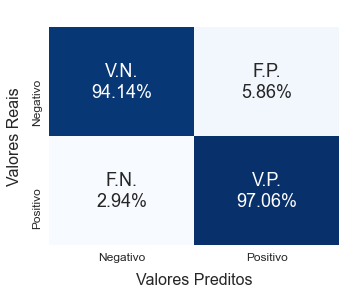

In [18]:
ml_tools.custom_cf_matrix(
    true_labels=y_test,
    predicted_labels=y_pred
)

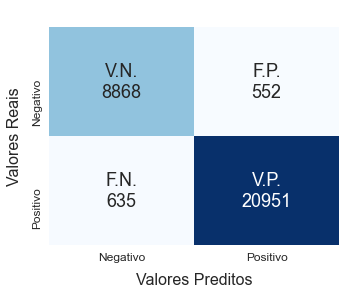

In [19]:
ml_tools.custom_cf_matrix(
    true_labels=y_test,
    predicted_labels=y_pred,
    normalize=None,
)

### Classification Report

In [20]:
# Salva o Relatório de classificação em um DataFrame
df_report = pd.DataFrame(metrics.classification_report(y_pred, y_test, output_dict=True, target_names=['Negativo', 'Positivo'])).drop('accuracy', axis=1).T
df_report['support'] = df_report['support'].astype('int')

In [21]:
print(f'Acurácia do modelo: {metrics.accuracy_score(y_test, y_pred):.2%}\n')
print('Relatório de Classificação:\n')
print(metrics.classification_report(y_pred, y_test))

Acurácia do modelo: 96.17%

Relatório de Classificação:

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      9503
           1       0.97      0.97      0.97     21503

    accuracy                           0.96     31006
   macro avg       0.96      0.95      0.95     31006
weighted avg       0.96      0.96      0.96     31006



## Curva AUC

Caculada a partir da matriz de probabilidades (y_pred_proba)

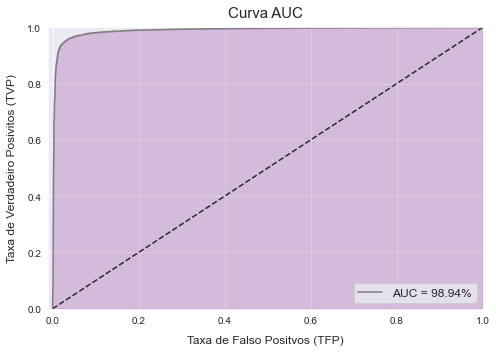

In [22]:
fig, ax = plt.subplots(figsize=(7,5))
#AUC Curve
fpr, tpr, thr = metrics.roc_curve(y_test,  y_pred_proba[:,1])
auc = metrics.roc_auc_score(y_test, y_pred_proba[:,1])

plt.plot([0, 1], [0, 1], 'k--', alpha=0.8)
plt.plot(fpr, tpr, label=f'AUC = {auc:.2%}', color='grey')
ax.fill_between(fpr, tpr, 0, alpha=0.2, color='purple')
plt.legend(loc=4,  prop={'size': 12})
plt.xlim([-0.01, 1.])
plt.ylim([0.0, 1.])
plt.xlabel('Taxa de Falso Positvos (TFP)', size=12, labelpad=10)
plt.ylabel('Taxa de Verdadeiro Posivitos (TVP)', size=12, labelpad=10)
plt.title('Curva AUC', size=15, pad=10)
plt.tight_layout()
plt.show()

### Várias Métricas

In [23]:
# Reúne e calcula várias métricas
df_performance = ml_tools.evaluate_model(
    true_labels=y_test,
    predicted_labels=y_pred,
    predicted_proba_labels=y_pred_proba
)
df_performance

,acurácia,precisão,revocação,f1_score,especificidade,auc
0,96.17%,97.43%,97.06%,97.25%,94.14%,98.94%


## Interpretando o Modelo com o LIME framework

In [24]:
# cria uma lista com todos os possíveis index do dados de teste
index_list = list(X_test.index)
# Garantea reproducibilidade do código seguinte
random.seed(10)
# seleciona aleatoriamente 3 documentos do corpus
list_sample = random.sample(index_list, 3)
print(list_sample)

[41500, 25820, 31035]


In [25]:
# Cria o objeto lime
explainer = LimeTextExplainer()

In [26]:
 # define que o primeiro documento da lista list_sample será interpretado
 doc_index = list_sample[0]
 # Faz a intepretação do modelo
 ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 41500
        Sentimento real: 1
        Sentimento predito: [1]


Probabilidade de predição do Modelo:
Classe 0: 0.016171
Classe 1: 0.983829


In [27]:
# define que o segundo documento da lista list_sample será interpretado
doc_index = list_sample[1]
# Faz a interpretação do modelo
ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 25820
        Sentimento real: 1
        Sentimento predito: [1]


Probabilidade de predição do Modelo:
Classe 0: 0.08665
Classe 1: 0.91335


In [28]:
# define que o terceiro documento da lista list_sample será interpretado
doc_index = list_sample[2]
# Faz a interpretação do modelo
ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 31035
        Sentimento real: 1
        Sentimento predito: [1]


Probabilidade de predição do Modelo:
Classe 0: 0.004151
Classe 1: 0.995849


In [29]:
# Cria uma lista de index com documentos com mais de 340 caracteres
big_doc_index = X_test[X_test.apply(lambda x: len(x.strip())) > 340].index
# Garantea reproducibilidade do código seguinte
random.seed(42)
# seleciona aleatoriamente 3 documentos do corpus
list_sample = random.sample(index_list, 3)

In [30]:
# define que o primeiro documento da lista big_doc_index será interpretado
doc_index = big_doc_index[0]
# Faz a interpretação do modelo
ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 123005
        Sentimento real: 0
        Sentimento predito: [0]


Probabilidade de predição do Modelo:
Classe 0: 0.73692
Classe 1: 0.26308


In [31]:
# define que o primeiro documento da lista big_doc_index será interpretado
doc_index = big_doc_index[1]
# Faz a interpretação do modelo
ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 43485
        Sentimento real: 1
        Sentimento predito: [1]


Probabilidade de predição do Modelo:
Classe 0: 0.155156
Classe 1: 0.844844


In [32]:
# define que o terceiro documento da lista big_doc_index será interpretado
doc_index = big_doc_index[2]
# Faz a interpretação do modelo
ml_tools.interpret_classification_model_prediction(
    clf=clf_lgr,
    doc_index=doc_index,
    test_corpus=X_test,
    true_labels=y_test,
    explainer_obj=explainer,
    text=True,
    save_to_file=True
)


        Index do documento de teste: 144858
        Sentimento real: 0
        Sentimento predito: [0]


Probabilidade de predição do Modelo:
Classe 0: 0.995234
Classe 1: 0.004766


In [33]:
ml_tools.success_message(4)

 

    Todos os trechos de código deste Jupyter Notebook foram executados com sucesso.
    Chegamos ao fim. Caso queira executar o modelo em novos dados, prossiga para o Jupyter
    Notebook 05_Novos_Dados.ipynb
        
    
